In [1]:
import pandas as pd
import numpy as np

In [2]:
JUMPCP_compounds = pd.read_csv("../data/processed/JUMPCP_compounds/JUMPCP_compounds_processed.csv.gz", compression="gzip")
JUMPCP_compounds = JUMPCP_compounds.drop_duplicates(subset="Standardized_SMILES", keep="first")
df = JUMPCP_compounds.drop_duplicates(subset="Standardized_SMILES", keep="first").reset_index(drop=True)
df

,Metadata_JCP2022,smiles,Standardized_SMILES,Standardized_InChI
0,JCP2022_000001,CCc1nccn1-c1cccc(C2CCCN2C(=O)c2ccc(OCCN(C)C)cc...,CCc1nccn1-c1cccc(C2CCC[NH+]2C(=O)c2ccc(OCC[NH+...,InChI=1S/C25H31N5O2/c1-4-23-26-14-16-30(23)24-...
1,JCP2022_000002,OC1=NCCCN1Cc1ccc(Cl)cc1,O=C1NCCC[NH+]1Cc1ccc(Cl)cc1,InChI=1S/C11H13ClN2O/c12-10-4-2-9(3-5-10)8-14-...
2,JCP2022_000004,CCCn1nccc1S(=O)(=O)N1CC2CCC1CNC2,CCCn1nccc1S(=O)(=O)[NH+]1CC2CCC1C[NH2+]C2,InChI=1S/C13H22N4O2S/c1-2-7-16-13(5-6-15-16)20...
3,JCP2022_000005,CCN=C(O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,CCNC(=O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...
4,JCP2022_000006,Cn1cc(-c2noc(-c3cc(C4CC4)n(C(C)(C)C)n3)n2)cn1,Cn1cc(-c2noc(-c3cc(C4CC4)n(C(C)(C)C)n3)n2)cn1,"InChI=1S/C16H20N6O/c1-16(2,3)22-13(10-5-6-10)7..."
...,...,...,...,...
115766,JCP2022_116749,CN(C)c1ccc(O)c2c1CC1CC3C(N(C)C)C(=O)C(C(=N)O)C...,CN(C)c1ccc([O-])c2c1CC1CC3C([NH+](C)C)C(=O)C(C...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...
115767,JCP2022_116750,Cc1nc(C)c(CCC(=O)N(C2CC2)C2CCCc3ccccc32)c(O)n1,Cc1nc(=O)c(CCC(=O)[NH+](C2CC2)C2CCCc3ccccc32)c...,InChI=1S/C22H27N3O2/c1-14-18(22(27)24-15(2)23-...
115768,JCP2022_116751,Cn1ccc2ccn(CCN=C(O)c3cnc4ccccc4n3)c(=O)c21,Cn1ccc2ccn(CCNC(=O)c3cnc4ccccc4n3)c(=O)c21,InChI=1S/C19H17N5O2/c1-23-9-6-13-7-10-24(19(26...
115769,JCP2022_116752,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,InChI=1S/C19H13F6N3O2S/c1-11-26-6-5-17(27-11)1...


In [3]:
from rdkit import Chem, DataStructs
from rdkit.Chem import Descriptors,Crippen

def GetExactMolWt(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.ExactMolWt (mol))
def GetCalcTPSA(s):
    mol = Chem.MolFromSmiles(s)
    return (Chem.rdMolDescriptors.CalcTPSA(mol))
def GetNumRotatableBonds(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumRotatableBonds (mol))
def GetNumHDonors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHDonors(mol))
def GetNumHAcceptors(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.NumHAcceptors(mol) )
def GetMolLogP(s):
    mol = Chem.MolFromSmiles(s)
    return (Descriptors.MolLogP(mol))

In [4]:
from pandarallel import pandarallel
pandarallel.initialize(progress_bar=True)

INFO: Pandarallel will run on 76 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [5]:
df['MolWt']=df['Standardized_SMILES'].parallel_apply(GetExactMolWt)
df['TPSA']=df['Standardized_SMILES'].parallel_apply(GetCalcTPSA) #Topological Polar Surface Area
df['nRotB']=df['Standardized_SMILES'].parallel_apply(GetNumRotatableBonds) #Number of rotable bonds
df['HBD']=df['Standardized_SMILES'].parallel_apply(GetNumHDonors) #Number of H bond donors
df['HBA']=df['Standardized_SMILES'].parallel_apply(GetNumHAcceptors) #Number of H bond acceptors
df['LogP']=df['Standardized_SMILES'].parallel_apply(GetMolLogP) #LogP

In [6]:
from rdkit import Chem
from mordred import Calculator, descriptors

#create descriptor calculator with all descriptors
calc = Calculator(descriptors, ignore_3D=True)

print(len(calc.descriptors))

Ser_Mol = df['Standardized_SMILES'].apply(Chem.MolFromSmiles)


1613


In [7]:
pandarallel.initialize(progress_bar = True)
Mordred_table=  calc.pandas(Ser_Mol)

INFO: Pandarallel will run on 76 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


  1%|▏                                    | 688/115771 [00:01<04:41, 409.34it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  2%|▌                                   | 1832/115771 [00:05<04:18, 440.10it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  3%|▉                                   | 3024/115771 [00:08<04:15, 440.51it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  4%|█▍                                  | 4536/115771 [00:13<06:07, 302.88it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  5%|█▋                                  | 5247/115771 [00:16<10:48, 170.41it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  5%|█▊                                  | 5913/115771 [00:19<04:51, 376.40it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  5%|█▉                                  | 6102/115771 [00:19<05:28, 334.20it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██                                  | 6466/115771 [00:20<04:20, 419.95it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██                                  | 6609/115771 [00:21<03:55, 463.64it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██                                  | 6746/115771 [00:22<08:50, 205.47it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  6%|██▏                                 | 7135/115771 [00:23<04:24, 410.40it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  7%|██▍                                 | 7875/115771 [00:25<04:24, 407.18it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


  8%|██▊                                 | 8938/115771 [00:29<04:55, 361.23it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 10%|███▍                               | 11504/115771 [00:36<03:04, 566.48it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 11%|███▋                               | 12346/115771 [00:38<03:07, 551.57it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 11%|███▉                               | 12943/115771 [00:40<03:23, 504.72it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 12%|████▎                              | 14420/115771 [00:45<03:50, 440.51it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 15%|█████▎                             | 17490/115771 [00:54<03:50, 426.55it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 15%|█████▎                             | 17540/115771 [00:55<05:07, 318.96it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 16%|█████▌                             | 18322/115771 [00:56<02:59, 542.82it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 16%|█████▌                             | 18486/115771 [00:57<03:23, 478.43it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 18%|██████▏                            | 20595/115771 [01:04<07:02, 225.39it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 20%|███████                            | 23403/115771 [01:11<02:33, 601.01it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 20%|███████▏                           | 23672/115771 [01:12<03:15, 471.59it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 22%|███████▌                           | 24948/115771 [01:15<04:13, 358.48it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 22%|███████▌                           | 25114/115771 [01:15<03:46, 399.98it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 22%|███████▊                            | 25211/115771 [01:19<24:04, 62.68it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 22%|███████▊                           | 25808/115771 [01:21<04:24, 339.51it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 23%|███████▉                           | 26142/115771 [01:22<03:09, 473.82it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 24%|████████▎                          | 27317/115771 [01:25<03:46, 391.25it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 25%|████████▋                          | 28631/115771 [01:28<05:40, 255.59it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 25%|████████▊                          | 28972/115771 [01:29<03:22, 429.66it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 25%|████████▊                          | 29221/115771 [01:29<03:22, 426.71it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 27%|█████████▋                          | 31237/115771 [01:39<19:46, 71.24it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 27%|█████████▌                         | 31549/115771 [01:40<06:50, 205.25it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 28%|█████████▋                         | 31913/115771 [01:40<03:22, 414.75it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 28%|█████████▋                         | 32229/115771 [01:41<03:59, 349.43it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 28%|█████████▊                         | 32429/115771 [01:42<03:49, 363.39it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 28%|█████████▉                         | 32699/115771 [01:43<02:56, 469.69it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 31%|██████████▋                        | 35466/115771 [01:49<03:10, 421.89it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 31%|██████████▊                        | 35575/115771 [01:50<04:01, 332.05it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 33%|████████████                        | 38673/115771 [02:02<25:31, 50.34it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 33%|████████████                        | 38752/115771 [02:03<18:08, 70.78it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 34%|███████████▊                       | 38927/115771 [02:03<08:38, 148.22it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 35%|████████████▏                      | 40279/115771 [02:06<02:40, 470.78it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 36%|████████████▌                      | 41474/115771 [02:09<02:34, 480.19it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 37%|████████████▉                      | 42742/115771 [02:12<03:07, 388.56it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 44%|███████████████▌                   | 51345/115771 [02:43<03:25, 312.89it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 49%|████████████████▉                  | 56150/115771 [02:55<02:08, 463.07it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 50%|█████████████████▌                 | 58249/115771 [03:00<02:15, 423.90it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 51%|█████████████████▊                 | 58781/115771 [03:01<02:25, 390.39it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 51%|██████████████████▍                 | 59439/115771 [03:12<13:41, 68.58it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 52%|██████████████████▎                | 60760/115771 [03:17<04:16, 214.59it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 56%|███████████████████▍               | 64397/115771 [03:27<01:59, 430.62it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 57%|███████████████████▉               | 65788/115771 [03:30<02:16, 366.19it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 63%|██████████████████████▊             | 73323/115771 [03:59<28:14, 25.05it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 66%|███████████████████████▏           | 76698/115771 [04:08<03:05, 210.20it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 68%|███████████████████████▋           | 78433/115771 [04:12<01:59, 311.83it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 70%|████████████████████████▍          | 81005/115771 [04:19<01:49, 317.28it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 82%|████████████████████████████▊      | 95166/115771 [05:06<00:53, 385.64it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 83%|█████████████████████████████      | 96147/115771 [05:08<00:36, 545.07it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 96%|████████████████████████████████▋ | 111234/115771 [05:45<00:11, 411.43it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


 99%|█████████████████████████████████▋| 114727/115771 [06:21<00:04, 239.09it/s]

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


100%|██████████████████████████████████| 115771/115771 [06:23<00:00, 302.02it/s]


In [8]:
Mordred_table 

,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,0,2,41.754673,2.451080,4.835478,41.754673,1.304834,4.393306,...,10.285718,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,0,1,19.325025,2.295713,4.591427,19.325025,1.288335,3.626969,...,9.365034,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,15.670087,14.074278,0,2,25.772484,2.502045,4.946303,25.772484,1.288624,3.941918,...,10.051261,68.287498,300.160900,6.821839,742,36,108.0,130.0,6.368056,4.388889
3,23.379612,18.956141,0,0,38.855842,2.542122,4.964726,38.855842,1.295195,4.337099,...,10.369326,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
4,18.747552,16.040519,0,0,29.465863,2.520264,4.804817,29.465863,1.281124,4.128070,...,10.191032,78.720938,312.169859,7.259764,1214,33,132.0,159.0,7.451389,4.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,26.067060,21.457796,1,1,40.137325,2.651875,5.303750,40.137325,1.216283,4.443841,...,10.938148,70.433553,457.184900,7.619748,2672,75,188.0,239.0,14.840278,6.972222
115767,21.367682,17.138865,1,1,34.932509,2.482824,4.911432,34.932509,1.293797,4.258685,...,10.330094,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
115768,20.591625,15.696032,0,0,34.533967,2.454100,4.830136,34.533967,1.328229,4.203596,...,10.234911,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.500000,5.666667
115769,24.489994,19.648264,0,0,37.073862,2.469485,4.938970,37.073862,1.195931,4.359595,...,10.478892,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [9]:
# Identify columns with <X unique values (not unique to 0.1% dataset)

#binary_integer_cols = [col for col in Mordred_table.columns if Mordred_table[col].nunique() <= 117]
binary_integer_cols = [col for col in Mordred_table.columns if Mordred_table[col].nunique() <= 113]
# Drop the identified columns
filtered_Mordred_table = Mordred_table.drop(columns=binary_integer_cols)
filtered_Mordred_table

,ABC,ABCGG,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,VE1_A,VE2_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,41.754673,2.451080,4.835478,41.754673,1.304834,4.393306,4.689825,0.146557,...,10.285718,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,2.295713,4.591427,19.325025,1.288335,3.626969,3.668389,0.244559,...,9.365034,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,15.670087,14.074278,25.772484,2.502045,4.946303,25.772484,1.288624,3.941918,3.985995,0.199300,...,10.051261,68.287498,300.160900,6.821839,742,36,108.0,130.0,6.368056,4.388889
3,23.379612,18.956141,38.855842,2.542122,4.964726,38.855842,1.295195,4.337099,4.489319,0.149644,...,10.369326,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
4,18.747552,16.040519,29.465863,2.520264,4.804817,29.465863,1.281124,4.128070,4.127509,0.179457,...,10.191032,78.720938,312.169859,7.259764,1214,33,132.0,159.0,7.451389,4.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,26.067060,21.457796,40.137325,2.651875,5.303750,40.137325,1.216283,4.443841,4.814011,0.145879,...,10.938148,70.433553,457.184900,7.619748,2672,75,188.0,239.0,14.840278,6.972222
115767,21.367682,17.138865,34.932509,2.482824,4.911432,34.932509,1.293797,4.258685,4.214273,0.156084,...,10.330094,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
115768,20.591625,15.696032,34.533967,2.454100,4.830136,34.533967,1.328229,4.203596,3.681046,0.141579,...,10.234911,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.500000,5.666667
115769,24.489994,19.648264,37.073862,2.469485,4.938970,37.073862,1.195931,4.359595,4.564755,0.147250,...,10.478892,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [10]:
from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.8)
filtered_Mordred_table_high_variance = selector.fit_transform(filtered_Mordred_table)

filtered_Mordred_table_high_variance = pd.DataFrame(filtered_Mordred_table_high_variance, columns=filtered_Mordred_table.columns[selector.get_support()])
filtered_Mordred_table_high_variance

/home/ss2686/miniconda3/envs/my-rdkit-env/lib/python3.9/site-packages/sklearn/feature_selection/_variance_threshold.py:104: RuntimeWarning: Degrees of freedom <= 0 for slice.
  self.variances_ = np.nanvar(X, axis=0)


,ABC,ABCGG,SpAbs_A,SpAD_A,VR1_A,VR2_A,VR3_A,nAtom,ATS0dv,ATS1dv,...,SRW09,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.57625,41.754673,41.754673,794.360158,24.823755,7.840688,65,378.0,402.0,...,7.285507,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,19.325025,66.358562,4.423904,4.600538,29,161.604938,157.111111,...,0.0,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,15.670087,14.074278,25.772484,25.772484,132.256899,6.612845,5.577893,44,216.444444,166.666667,...,6.985642,68.287498,300.1609,6.821839,742,36,108.0,130.0,6.368056,4.388889
3,23.379612,18.956141,38.855842,38.855842,388.200341,12.940011,7.060134,52,415.604938,444.111111,...,7.050123,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
4,18.747552,16.040519,29.465863,29.465863,206.173495,8.964065,6.161627,43,330.0,379.0,...,8.248791,78.720938,312.169859,7.259764,1214,33,132.0,159.0,7.451389,4.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,26.06706,21.457796,40.137325,40.137325,301.353901,9.131936,6.902208,60,532.0,482.0,...,0.0,70.433553,457.1849,7.619748,2672,75,188.0,239.0,14.840278,6.972222
115767,21.367682,17.138865,34.932509,34.932509,330.710866,12.248551,6.794496,54,338.0,343.0,...,7.26473,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
115768,20.591625,15.696032,34.533967,34.533967,688.012275,26.462011,7.489318,43,390.0,405.0,...,6.823286,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.5,5.666667
115769,24.489994,19.648264,37.073862,37.073862,381.979436,12.321917,7.076769,44,658.444444,483.333333,...,0.0,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [11]:
import pandas as pd
filtered_Mordred_table_high_variance.to_csv("filtered_Mordred_table.csv.gz", compression="gzip", index=False)
filtered_Mordred_table_high_variance = pd.read_csv("filtered_Mordred_table.csv.gz", compression="gzip")

/tmp/ipykernel_31933/1268609695.py:3: DtypeWarning: Columns (110,111,112,113,114,115,118,119,120,121,122,126,127,128,129,130,131,135,136,137,138,139,140,144,145,146,147,148,149,153,154,155,156,157,158,253,254,258,259,260,261,262,263,267,268,269,270,271,272,276,277,278,279,280,281,414,415,416,417,439,440,494,495,526) have mixed types. Specify dtype option on import or set low_memory=False.
  filtered_Mordred_table_high_variance = pd.read_csv("filtered_Mordred_table.csv.gz", compression="gzip")


In [12]:
def contains_string(series):
    return series.apply(lambda x: isinstance(x, str)).any()

cols_to_drop = [col for col in filtered_Mordred_table_high_variance.columns if contains_string(filtered_Mordred_table_high_variance[col])]
filtered_Mordred_table_high_variance = filtered_Mordred_table_high_variance.drop(columns=cols_to_drop)
filtered_Mordred_table_high_variance

,ABC,ABCGG,SpAbs_A,SpAD_A,VR1_A,VR2_A,VR3_A,nAtom,ATS0dv,ATS1dv,...,SRW09,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,41.754673,41.754673,794.360158,24.823755,7.840688,65,378.000000,402.000000,...,7.285507,83.455755,435.262328,6.696344,3322,48,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,19.325025,66.358562,4.423904,4.600538,29,161.604938,157.111111,...,0.000000,46.630856,225.078917,7.761342,388,19,74.0,83.0,4.694444,3.361111
2,15.670087,14.074278,25.772484,25.772484,132.256899,6.612845,5.577893,44,216.444444,166.666667,...,6.985642,68.287498,300.160900,6.821839,742,36,108.0,130.0,6.368056,4.388889
3,23.379612,18.956141,38.855842,38.855842,388.200341,12.940011,7.060134,52,415.604938,444.111111,...,7.050123,80.170869,423.146203,8.137427,2204,54,160.0,192.0,9.722222,6.694444
4,18.747552,16.040519,29.465863,29.465863,206.173495,8.964065,6.161627,43,330.000000,379.000000,...,8.248791,78.720938,312.169859,7.259764,1214,33,132.0,159.0,7.451389,4.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,26.067060,21.457796,40.137325,40.137325,301.353901,9.131936,6.902208,60,532.000000,482.000000,...,0.000000,70.433553,457.184900,7.619748,2672,75,188.0,239.0,14.840278,6.972222
115767,21.367682,17.138865,34.932509,34.932509,330.710866,12.248551,6.794496,54,338.000000,343.000000,...,7.264730,80.928598,365.210327,6.763154,1865,45,146.0,175.0,8.361111,5.861111
115768,20.591625,15.696032,34.533967,34.533967,688.012275,26.462011,7.489318,43,390.000000,405.000000,...,6.823286,75.168832,347.138225,8.072982,1890,42,140.0,167.0,7.500000,5.666667
115769,24.489994,19.648264,37.073862,37.073862,381.979436,12.321917,7.076769,44,658.444444,483.333333,...,0.000000,67.257838,461.063267,10.478711,2724,50,168.0,194.0,12.965278,6.319444


In [13]:
filtered_Mordred_table_high_variance = filtered_Mordred_table_high_variance.astype('float')
filtered_Mordred_table_high_variance

,ABC,ABCGG,SpAbs_A,SpAD_A,VR1_A,VR2_A,VR3_A,nAtom,ATS0dv,ATS1dv,...,SRW09,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,24.834266,19.576250,41.754673,41.754673,794.360158,24.823755,7.840688,65.0,378.000000,402.000000,...,7.285507,83.455755,435.262328,6.696344,3322.0,48.0,166.0,195.0,9.611111,7.166667
1,11.492048,9.643032,19.325025,19.325025,66.358562,4.423904,4.600538,29.0,161.604938,157.111111,...,0.000000,46.630856,225.078917,7.761342,388.0,19.0,74.0,83.0,4.694444,3.361111
2,15.670087,14.074278,25.772484,25.772484,132.256899,6.612845,5.577893,44.0,216.444444,166.666667,...,6.985642,68.287498,300.160900,6.821839,742.0,36.0,108.0,130.0,6.368056,4.388889
3,23.379612,18.956141,38.855842,38.855842,388.200341,12.940011,7.060134,52.0,415.604938,444.111111,...,7.050123,80.170869,423.146203,8.137427,2204.0,54.0,160.0,192.0,9.722222,6.694444
4,18.747552,16.040519,29.465863,29.465863,206.173495,8.964065,6.161627,43.0,330.000000,379.000000,...,8.248791,78.720938,312.169859,7.259764,1214.0,33.0,132.0,159.0,7.451389,4.694444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,26.067060,21.457796,40.137325,40.137325,301.353901,9.131936,6.902208,60.0,532.000000,482.000000,...,0.000000,70.433553,457.184900,7.619748,2672.0,75.0,188.0,239.0,14.840278,6.972222
115767,21.367682,17.138865,34.932509,34.932509,330.710866,12.248551,6.794496,54.0,338.000000,343.000000,...,7.264730,80.928598,365.210327,6.763154,1865.0,45.0,146.0,175.0,8.361111,5.861111
115768,20.591625,15.696032,34.533967,34.533967,688.012275,26.462011,7.489318,43.0,390.000000,405.000000,...,6.823286,75.168832,347.138225,8.072982,1890.0,42.0,140.0,167.0,7.500000,5.666667
115769,24.489994,19.648264,37.073862,37.073862,381.979436,12.321917,7.076769,44.0,658.444444,483.333333,...,0.000000,67.257838,461.063267,10.478711,2724.0,50.0,168.0,194.0,12.965278,6.319444


In [14]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# data scaling

pca = PCA(n_components=2)

features_Std = StandardScaler().fit_transform(filtered_Mordred_table_high_variance)
pca_res = pca.fit_transform(features_Std)

print('Shape before PCA: ', pca_res.shape)
print('Shape after PCA: ', pca_res.shape)

pca_df = pd.DataFrame(
    data=pca_res, 
    columns=['PC1', 'PC2'])

Shape before PCA:  (115771, 2)
Shape after PCA:  (115771, 2)


In [15]:
df['PC1'] = pca_df['PC1'] 
df['PC2'] = pca_df['PC2'] 

In [16]:
import numpy as np
pcv_1 = np.round(pca.explained_variance_ratio_[0], 4)*100
pcv_2 = np.round(pca.explained_variance_ratio_[1], 4)*100
print(pcv_1, pcv_2)

45.45 7.61


In [17]:
pcv_1 +pcv_2

53.06

<AxesSubplot:xlabel='PC1', ylabel='PC2'>

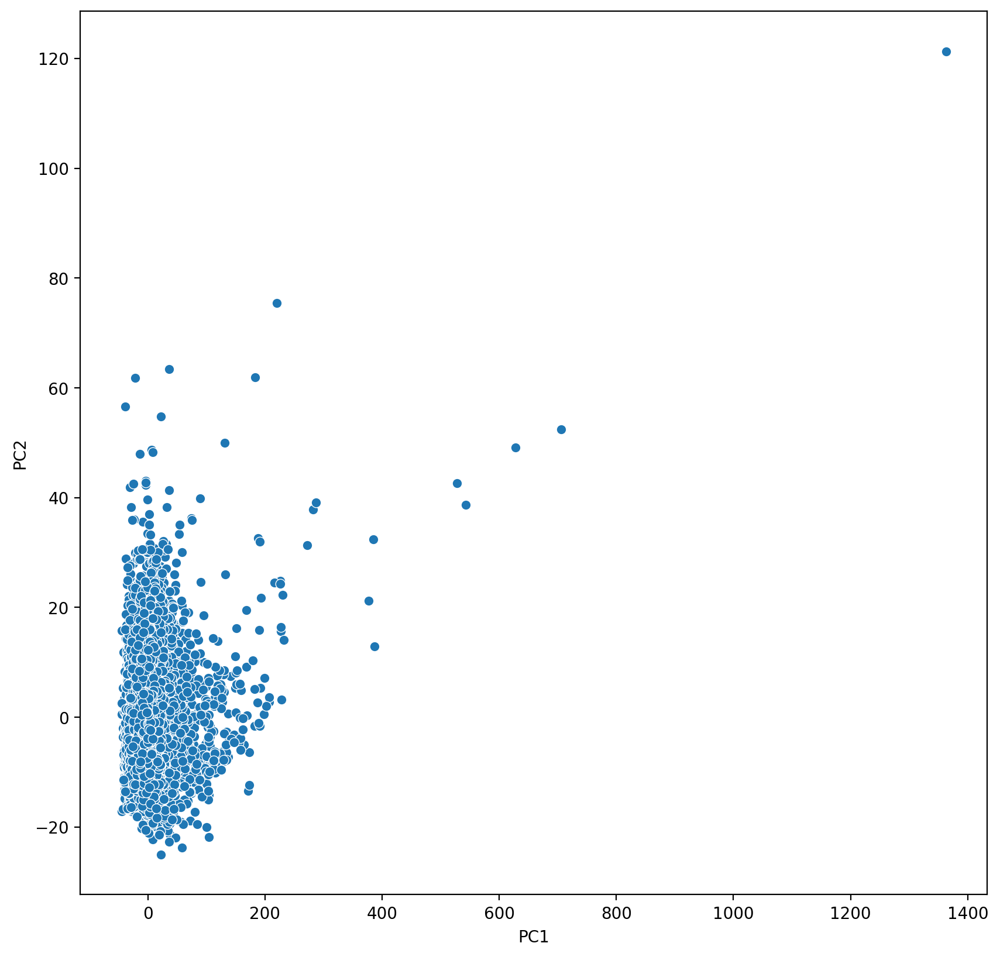

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="PC1", y="PC2", palette="deep")

In [19]:
from MulticoreTSNE import MulticoreTSNE
import numpy as np
import matplotlib.pyplot as plt

# Create the t-SNE instance
tsne = MulticoreTSNE(n_components=2 , verbose=2, n_jobs=-1)  # n_jobs is the number of cores you want to use

# Perform t-SNE dimensionality reduction
tsne_res = tsne.fit_transform(features_Std)

tsne_df = pd.DataFrame(data=tsne_res, columns=['tsne_1', 'tsne_2'])

Performing t-SNE using 76 cores.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
 - point 11577 of 115771
 - point 23154 of 115771
 - point 34731 of 115771
 - point 46308 of 115771
 - point 57885 of 115771
 - point 69462 of 115771
 - point 81039 of 115771
 - point 92616 of 115771
 - point 104193 of 115771
 - point 115770 of 115771
Done in 43.00 seconds (sparsity = 0.001228)!
Learning embedding...
Iteration 51: error is 125.452696 (50 iterations in 12.00 seconds)
Iteration 101: error is 125.423743 (50 iterations in 12.00 seconds)
Iteration 151: error is 123.461111 (50 iterations in 12.00 seconds)
Iteration 201: error is 118.174659 (50 iterations in 11.00 seconds)
Iteration 251: error is 116.053244 (50 iterations in 12.00 seconds)
Iteration 301: error is 6.117548 (50 iterations in 11.00 seconds)
Iteration 351: error is 5.773723 (50 iterations in 12.00 seconds)
Iteration 401: error is 5.576408 (50 iterations in 11.00 seconds

In [20]:
df['tsne_1'] = tsne_df['tsne_1'] 
df['tsne_2'] = tsne_df['tsne_2'] 
df

,Metadata_JCP2022,smiles,Standardized_SMILES,Standardized_InChI,MolWt,TPSA,nRotB,HBD,HBA,LogP,PC1,PC2,tsne_1,tsne_2
0,JCP2022_000001,CCc1nccn1-c1cccc(C2CCCN2C(=O)c2ccc(OCCN(C)C)cc...,CCc1nccn1-c1cccc(C2CCC[NH+]2C(=O)c2ccc(OCC[NH+...,InChI=1S/C25H31N5O2/c1-4-23-26-14-16-30(23)24-...,435.262328,65.89,8,2,5,0.91320,16.366793,-6.990348,13.246278,-13.171646
1,JCP2022_000002,OC1=NCCCN1Cc1ccc(Cl)cc1,O=C1NCCC[NH+]1Cc1ccc(Cl)cc1,InChI=1S/C11H13ClN2O/c12-10-4-2-9(3-5-10)8-14-...,225.078917,33.54,2,2,1,0.83820,-21.531005,-4.431234,-3.678417,21.895355
2,JCP2022_000004,CCCn1nccc1S(=O)(=O)N1CC2CCC1CNC2,CCCn1nccc1S(=O)(=O)[NH+]1CC2CCC1C[NH2+]C2,InChI=1S/C13H22N4O2S/c1-2-7-16-13(5-6-15-16)20...,300.160900,73.01,4,2,4,-1.77770,-5.964026,-5.823078,-19.672432,-8.448346
3,JCP2022_000005,CCN=C(O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,CCNC(=O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...,423.146203,81.40,5,1,6,3.65602,10.712766,1.411265,2.168400,-14.198626
4,JCP2022_000006,Cn1cc(-c2noc(-c3cc(C4CC4)n(C(C)(C)C)n3)n2)cn1,Cn1cc(-c2noc(-c3cc(C4CC4)n(C(C)(C)C)n3)n2)cn1,"InChI=1S/C16H20N6O/c1-16(2,3)22-13(10-5-6-10)7...",312.169859,74.56,3,0,7,2.96600,-4.974252,-3.396917,5.396065,7.751461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,JCP2022_116749,CN(C)c1ccc(O)c2c1CC1CC3C(N(C)C)C(=O)C(C(=N)O)C...,CN(C)c1ccc([O-])c2c1CC1CC3C([NH+](C)C)C(=O)C(C...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...,457.184900,162.34,3,3,8,-3.11610,25.227709,2.093329,1.897703,-18.281203
115767,JCP2022_116750,Cc1nc(C)c(CCC(=O)N(C2CC2)C2CCCc3ccccc32)c(O)n1,Cc1nc(=O)c(CCC(=O)[NH+](C2CC2)C2CCCc3ccccc32)c...,InChI=1S/C22H27N3O2/c1-14-18(22(27)24-15(2)23-...,365.210327,65.57,5,1,3,1.59994,6.142337,-6.761332,16.792526,3.876834
115768,JCP2022_116751,Cn1ccc2ccn(CCN=C(O)c3cnc4ccccc4n3)c(=O)c21,Cn1ccc2ccn(CCNC(=O)c3cnc4ccccc4n3)c(=O)c21,InChI=1S/C19H17N5O2/c1-23-9-6-13-7-10-24(19(26...,347.138225,81.81,4,1,6,1.71320,-1.245208,0.808472,2.191027,-3.566622
115769,JCP2022_116752,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,InChI=1S/C19H13F6N3O2S/c1-11-26-6-5-17(27-11)1...,461.063267,71.95,4,1,4,5.29042,11.219936,23.029174,-25.933233,5.134265


<AxesSubplot:xlabel='tsne_1', ylabel='tsne_2'>

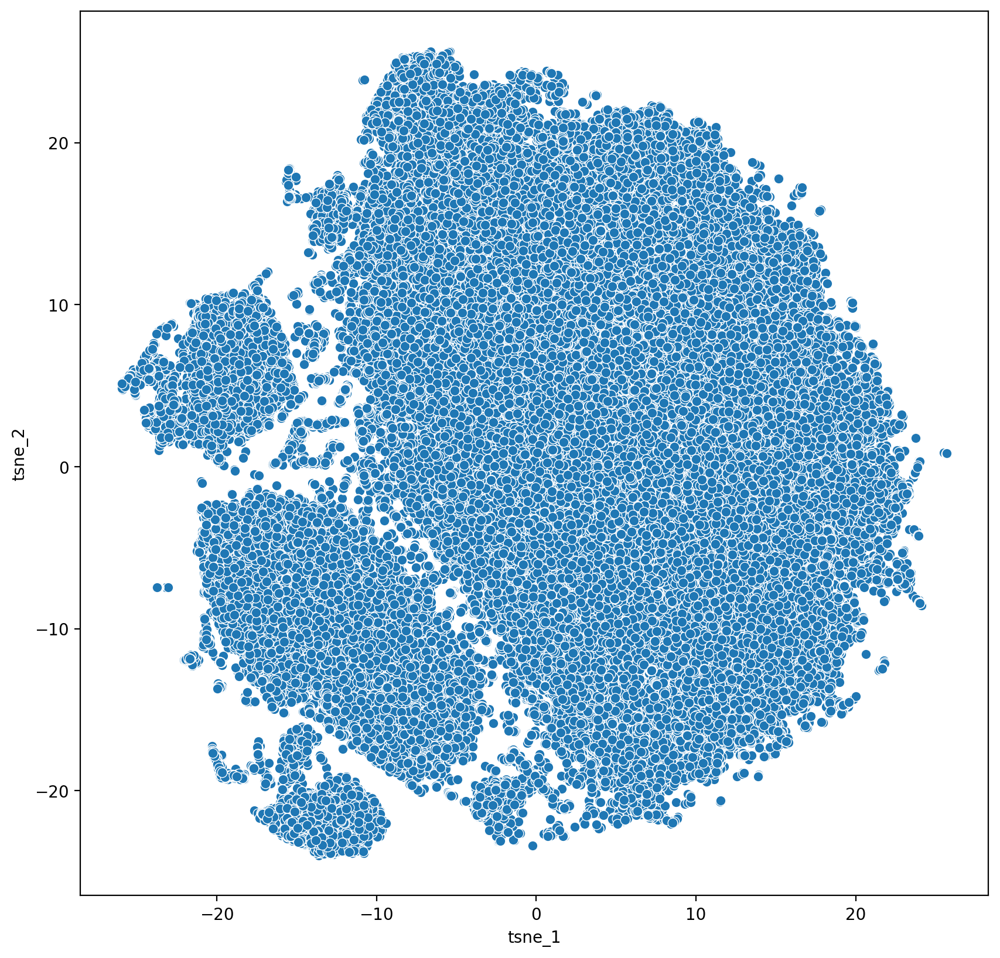

In [21]:
fig, ax = plt.subplots(figsize=(10, 10), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", palette="deep")

In [22]:
df.to_csv("all_compounds_112926_pca_tsne.csv.gz", index=False, compression="gzip")

In [23]:
df =pd.read_csv("all_compounds_112926_pca_tsne.csv.gz", compression="gzip")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


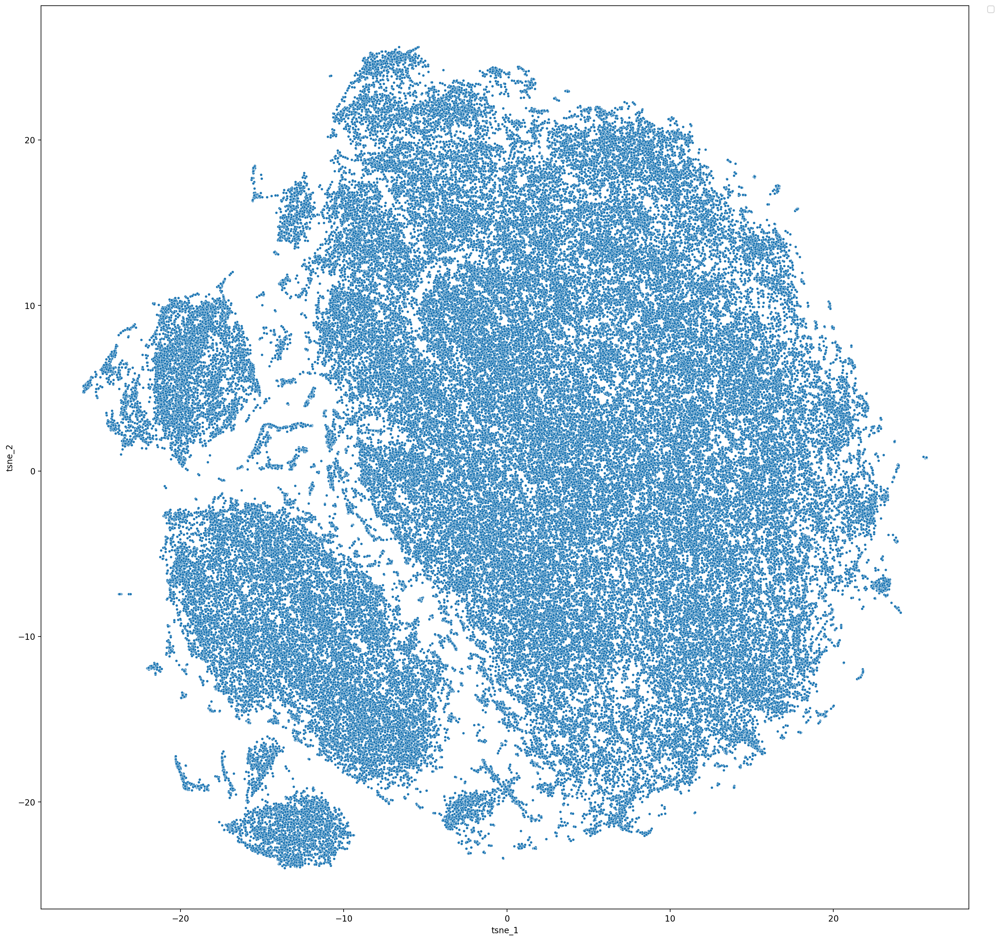

In [24]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=200)
sns.scatterplot(data=df, x="tsne_1", y="tsne_2", s=10)
plt.title("")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()

In [25]:
ATC_KEGG_processed = pd.read_csv("../data/KeggDrugVirtualScreening/ATC_KEGG_processed.csv.gz", compression="gzip")
ATC_KEGG_processed = ATC_KEGG_processed.drop_duplicates(subset="Standardized_SMILES", keep="first")
ATC_KEGG_processed = ATC_KEGG_processed.drop_duplicates(subset="Standardized_InChI", keep="first").reset_index(drop=True)
ATC_KEGG_processed["Space"] = "Drugs"
ATC_KEGG_processed

,SMILES,KEGG_code,CompoundName,BigGroup_ATC_class,ATC_label_class,Standardized_SMILES,Standardized_InChI,Space
0,[N@@H+](CCCCCCCCCCCCCCCCCC)(CCC[NH+](CCO)CCO)CCO,D05241,Olaflur (USAN/INN),ALIMENTARY TRACT AND METABOLISM,Caries prophylactic agents,CCCCCCCCCCCCCCCCCC[NH+](CCO)CCC[NH+](CCO)CCO,InChI=1S/C27H58N2O3/c1-2-3-4-5-6-7-8-9-10-11-1...,Drugs
1,[C@H]12[C@@H]([C@H](C[C@](O1)(C[C@H](C[C@H]([C...,D00203,Amphotericin B (JP17/USP/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,CC1C=CC=CC=CC=CC=CC=CC=CC(OC2OC(C)C(O)C([NH3+]...,InChI=1S/C47H73NO17/c1-27-17-15-13-11-9-7-5-6-...,Drugs
2,c1ccc(cc1)OCC[N+](C)(C)CCCCCCCCCCCC,D01588,Domiphen bromide (JAN/USAN/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,CCCCCCCCCCCC[N+](C)(C)CCOc1ccccc1,InChI=1S/C22H40NO/c1-4-5-6-7-8-9-10-11-12-16-1...,Drugs
3,c1ccc2c(c1O)nccc2,D05321,Oxyquinoline (USAN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,[O-]c1cccc2cccnc12,InChI=1S/C9H7NO/c11-8-5-1-3-7-4-2-6-10-9(7)8/h...,Drugs
4,c1(cc(c(cc1)CO[C@@H](Cn1cncc1)c1c(cc(cc1)Cl)Cl...,D00416,Miconazole (JP17/USP/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,Clc1ccc(COC(Cn2ccnc2)c2ccc(Cl)cc2Cl)c(Cl)c1,InChI=1S/C18H14Cl4N2O/c19-13-2-1-12(16(21)7-13...,Drugs
...,...,...,...,...,...,...,...,...
2311,O=C(C[N@H+](CC[NH+](CC(=O)O)CC(=O)O)CC[N@H+](C...,D02108,Indium In 111 pentetreotide (USP),VARIOUS,Indium (111In) compounds,CC(O)C(CO)NC(=O)C1CSSCC(NC(=O)C(Cc2ccccc2)NC(=...,InChI=1S/C63H87N13O19S2/c1-37(78)48(34-77)70-6...,Drugs
2312,[C@H]1([C@H]([C@@H]([C@H](O[C@@H]1O)CO)O)O)F,D01843,Fludeoxyglucose F 18 (USP),VARIOUS,Other diagnostic radiopharmaceuticals for tum...,OCC1OC(O)C(F)C(O)C1O,InChI=1S/C6H11FO5/c7-3-5(10)4(9)2(1-8)12-6(3)1...,Drugs
2313,c1c(c(cc(c1F)C[C@@H](C(=O)O)[NH3+])O)O,D04220,Fluorodopa F 18 (USP),VARIOUS,Other diagnostic radiopharmaceuticals for tum...,[NH3+]C(Cc1cc([O-])c([O-])cc1F)C(=O)[O-],InChI=1S/C9H10FNO4/c10-5-3-8(13)7(12)2-4(5)1-6...,Drugs
2314,[C@H]12[C@H]3[C@@H]([C@@]4(C(=CC3)C[C@H](CC4)O...,D04567,Iodocholesterol I 131 (USAN),VARIOUS,Iodine (131I) compounds,CC(C)CCCC(C)C1CCC2C3CC=C4CC(O)CCC4(CI)C3CCC12C,InChI=1S/C27H45IO/c1-18(2)6-5-7-19(3)23-10-11-...,Drugs


In [26]:
JUMP_drugs = df.merge(ATC_KEGG_processed, on="Standardized_SMILES", how="left")
JUMP_drugs['Space'] = JUMP_drugs['Space'].fillna('JUMP_Compounds')
JUMP_drugs

,Metadata_JCP2022,smiles,Standardized_SMILES,Standardized_InChI_x,MolWt,TPSA,nRotB,HBD,HBA,LogP,...,PC2,tsne_1,tsne_2,SMILES,KEGG_code,CompoundName,BigGroup_ATC_class,ATC_label_class,Standardized_InChI_y,Space
0,JCP2022_000001,CCc1nccn1-c1cccc(C2CCCN2C(=O)c2ccc(OCCN(C)C)cc...,CCc1nccn1-c1cccc(C2CCC[NH+]2C(=O)c2ccc(OCC[NH+...,InChI=1S/C25H31N5O2/c1-4-23-26-14-16-30(23)24-...,435.262328,65.89,8,2,5,0.91320,...,-6.990348,13.246278,-13.171646,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
1,JCP2022_000002,OC1=NCCCN1Cc1ccc(Cl)cc1,O=C1NCCC[NH+]1Cc1ccc(Cl)cc1,InChI=1S/C11H13ClN2O/c12-10-4-2-9(3-5-10)8-14-...,225.078917,33.54,2,2,1,0.83820,...,-4.431234,-3.678417,21.895355,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
2,JCP2022_000004,CCCn1nccc1S(=O)(=O)N1CC2CCC1CNC2,CCCn1nccc1S(=O)(=O)[NH+]1CC2CCC1C[NH2+]C2,InChI=1S/C13H22N4O2S/c1-2-7-16-13(5-6-15-16)20...,300.160900,73.01,4,2,4,-1.77770,...,-5.823078,-19.672432,-8.448346,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
3,JCP2022_000005,CCN=C(O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,CCNC(=O)CC1N=C(c2ccc(Cl)cc2)c2cc(OC)ccc2-n2c(C...,InChI=1S/C22H22ClN5O2/c1-4-24-20(29)12-18-22-2...,423.146203,81.40,5,1,6,3.65602,...,1.411265,2.168400,-14.198626,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
4,JCP2022_000006,Cn1cc(-c2noc(-c3cc(C4CC4)n(C(C)(C)C)n3)n2)cn1,Cn1cc(-c2noc(-c3cc(C4CC4)n(C(C)(C)C)n3)n2)cn1,"InChI=1S/C16H20N6O/c1-16(2,3)22-13(10-5-6-10)7...",312.169859,74.56,3,0,7,2.96600,...,-3.396917,5.396065,7.751461,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115766,JCP2022_116749,CN(C)c1ccc(O)c2c1CC1CC3C(N(C)C)C(=O)C(C(=N)O)C...,CN(C)c1ccc([O-])c2c1CC1CC3C([NH+](C)C)C(=O)C(C...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...,457.184900,162.34,3,3,8,-3.11610,...,2.093329,1.897703,-18.281203,[C@@H]12[C@](C(=C3[C@H](C2)Cc2c(C3=O)c(ccc2N(C...,D05045,Minocycline (USAN/INN),ALIMENTARY TRACT AND METABOLISM,Antiinfectives and antiseptics for local oral...,InChI=1S/C23H27N3O7/c1-25(2)12-5-6-13(27)15-10...,Drugs
115767,JCP2022_116750,Cc1nc(C)c(CCC(=O)N(C2CC2)C2CCCc3ccccc32)c(O)n1,Cc1nc(=O)c(CCC(=O)[NH+](C2CC2)C2CCCc3ccccc32)c...,InChI=1S/C22H27N3O2/c1-14-18(22(27)24-15(2)23-...,365.210327,65.57,5,1,3,1.59994,...,-6.761332,16.792526,3.876834,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
115768,JCP2022_116751,Cn1ccc2ccn(CCN=C(O)c3cnc4ccccc4n3)c(=O)c21,Cn1ccc2ccn(CCNC(=O)c3cnc4ccccc4n3)c(=O)c21,InChI=1S/C19H17N5O2/c1-23-9-6-13-7-10-24(19(26...,347.138225,81.81,4,1,6,1.71320,...,0.808472,2.191027,-3.566622,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds
115769,JCP2022_116752,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,Cc1nccc(-c2cccc(NS(=O)(=O)c3cc(C(F)(F)F)cc(C(F...,InChI=1S/C19H13F6N3O2S/c1-11-26-6-5-17(27-11)1...,461.063267,71.95,4,1,4,5.29042,...,23.029174,-25.933233,5.134265,NaN,NaN,NaN,NaN,NaN,NaN,JUMP_Compounds


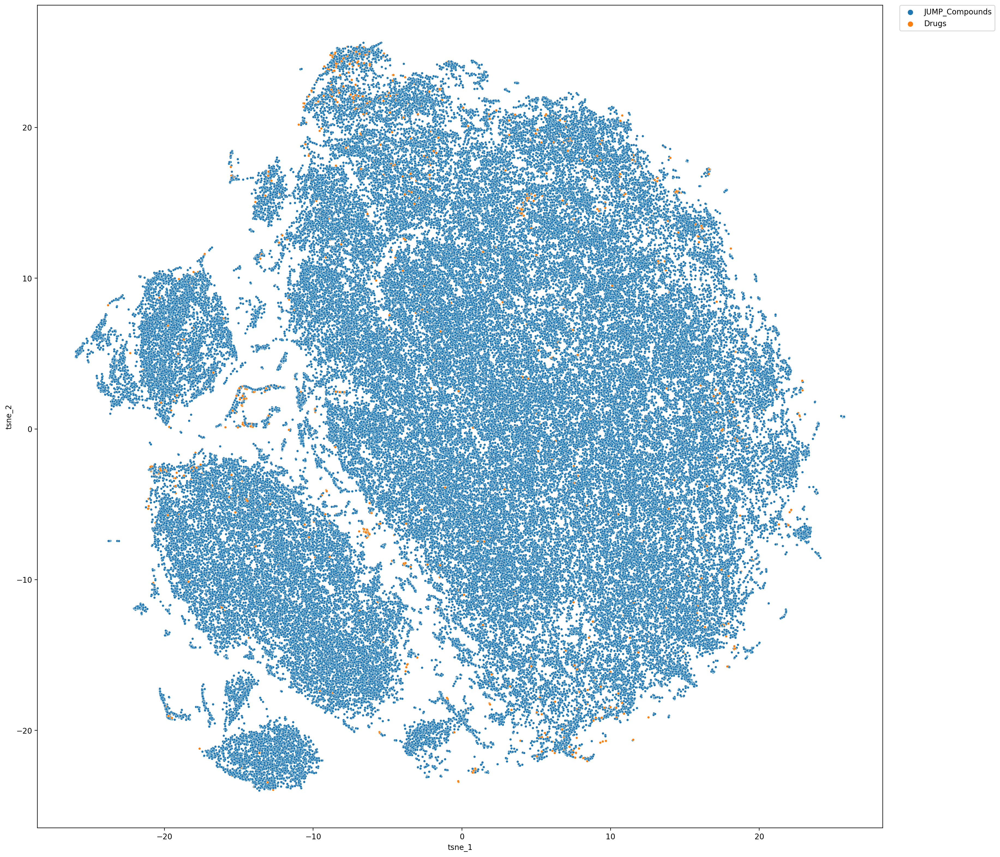

In [27]:
fig, ax = plt.subplots(figsize=(20, 20), dpi=200)
sns.scatterplot(data=JUMP_drugs, x="tsne_1", y="tsne_2", hue="Space", s=10)
plt.title("")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.show()